The purpose of this notebook is to explore convolutions -- we used one in the segmentation notebook but didn't really go into how it was used to extract features of the slice. They are used extensively in deep learning (https://en.wikipedia.org/wiki/Convolutional_neural_network) & <br>(https://en.wikipedia.org/wiki/Kernel_(image_processing)) 

Initially done with the scans but the human eye is not great at perceiving those... so decided to choose a more interpretable image for this exploration -- my sisters new dog :)

We used scipy in the segmentation notebook but here we'll explore image processing as provided by OpenCV (https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_table_of_contents_imgproc/py_table_of_contents_imgproc.html)

In [239]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 as cv
from nbdev.showdoc import *
from IPython.display import Image
from fastai2.vision.all import *

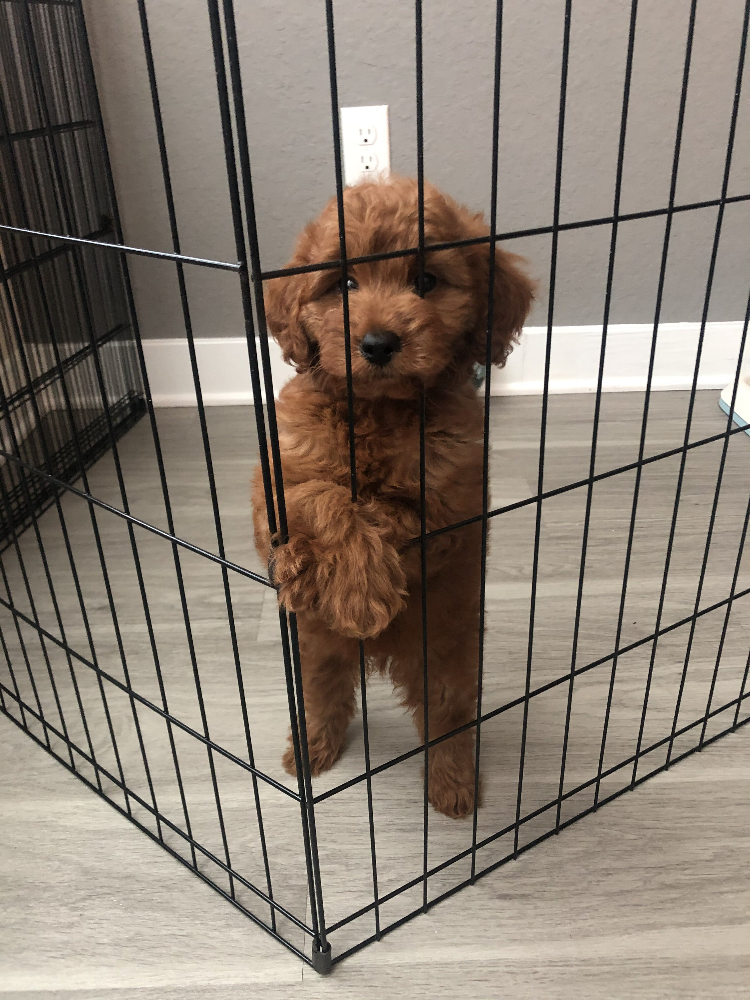

In [137]:
Image.open('kona.jpg')

In [216]:
img = cv.imread('kona.jpg')

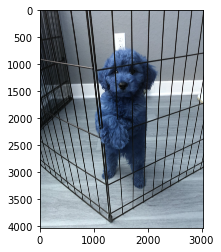

In [217]:
plt.imshow(img);

That's now what we were expecting. This is because openCV returns the image channels BACKWARDS in Blue-Green-Red vs the desired Red-Green-Blue -- the channel axis is at the end. We can convert this last axis manually as shown below

In [162]:
img.shape

(4032, 3024, 3)

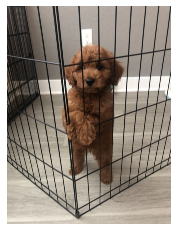

In [163]:
plt.axis('off')
plt.imshow(img[:, :, [2,1,0]]);

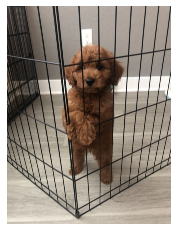

In [166]:
#cv2 has a handy fxn for just this
plt.axis('off')
plt.imshow(cv.cvtColor(img, cv.COLOR_RGB2BGR));

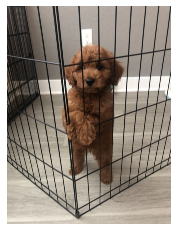

In [218]:
#let's save this as the image pixel information
img = cv.cvtColor(img, cv.COLOR_RGB2BGR)
plt.axis('off')
plt.imshow(img);

We'll try out differnt convolutions to see what information we can glean from each mathematical manipulation

To start we'll take a look at a very simple kernel which is 5 by 5 and each weight is the same

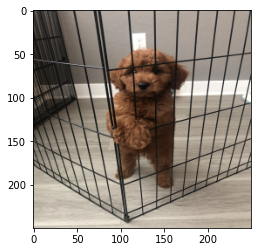

In [186]:
plt.imshow(cv2.resize(img, (250,250), interpolation=cv2.INTER_AREA))

In [182]:
kernel = np.ones((3,3))/9
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

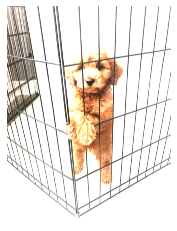

In [183]:
#What will this kernel do?
plt.axis('off')
plt.imshow(cv.filter2D(img, -1, sharp_kernel));

It was supposed to blur the image but since there's so much empty space it just looks washed out. Let's work on cropping out all the extra space

In [208]:
img.shape

(4032, 3024, 3)

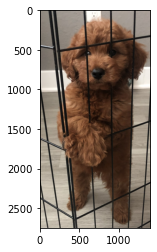

In [219]:
img = img[600:3350, 800:2200 ]
plt.imshow(img);

It's annoying to have to keep specifying the desired size like this:

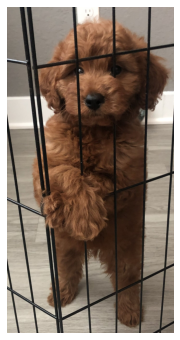

In [371]:
fig, ax = subplots(figsize=(6,6))
plt.axis('off')
ax[0].imshow(img, cmap='viridis');

In [242]:
def show_img(img):
    fig, ax = subplots(figsize=(6,6))
    plt.axis('off')
    ax[0].imshow(img);

Now let's start playing with some kernels :)

In [255]:
b_kernel = np.ones((7,7), dtype=np.float32)/49
b_kernel

array([[0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816]], dtype=float32)

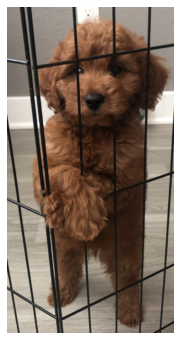

In [267]:
b_img = cv.filter2D(img, -1, b_kernel)
show_img(b_img)

The CV2 convolution fxn is cv.filter2D(img, ddepth, kernel) --> where ddepth is the desired depth of the output image, if you set it to -1 it will be the same as the input image

We want to be able to compare the convolved image with the original -- let's fix up that show_img fxn

In [375]:
def compare_imgs(img, conv_img, dimensions, cmap=None):
    fig, ax = subplots(1, 2, figsize=dimensions)
    ax[0].axis('off')
    ax[1].axis('off')
    ax[0].imshow(img)
    ax[1].imshow(conv_img)
    ax[1].set_title('Convolved Kona');

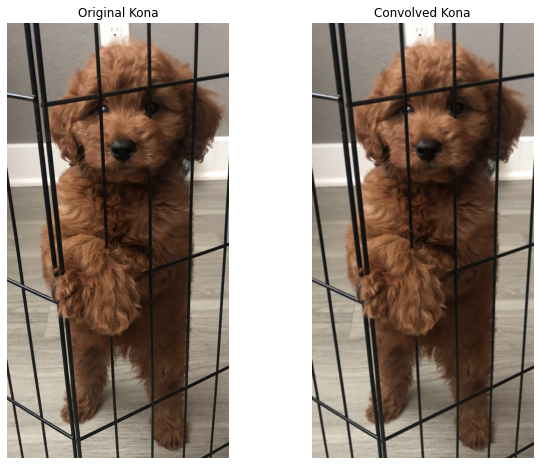

In [333]:
compare_imgs(img, b_img, (10,8))

Ok you really can't see any differnce because the original image was WAY too big -- let's resize it to 224x224 and then try it again :)

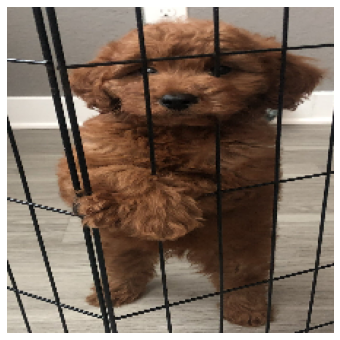

In [308]:
small_img = cv2.resize(img, dsize=(224,224))
show_img(small_img)

A little blurry to start means we can see how to improve lower quality items

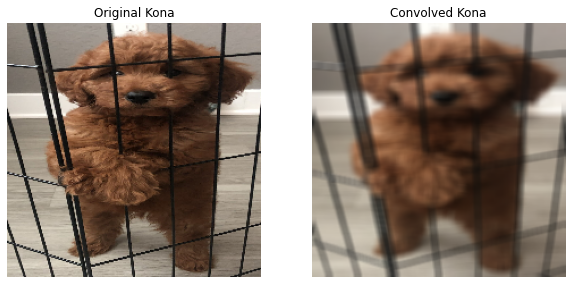

In [309]:
b_small_img = cv.filter2D(small_img, -1, b_kernel)
compare_imgs(small_img, b_small_img, (10, 6))

Woo -- ok so it blurred the image as expected! :)

In [310]:
sharp_kernel = [[0, -1, 0],
               [-1, 5, -1],
               [0, -1, 0]]
sharp_kernel = np.array(sharp_kernel, np.float32)

In [330]:
s_small_img = cv.filter2D(small_img, -1, sharp_kernel)

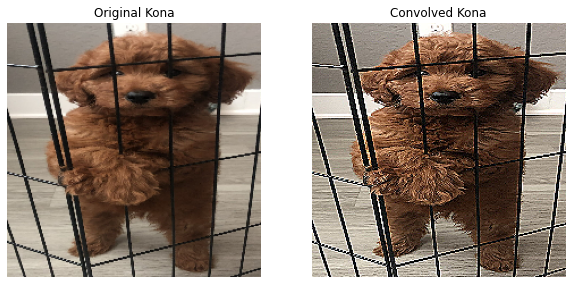

In [331]:
compare_imgs(small_img, s_small_img, (10,6))

The sharp kernel is sharpening each pixel -- looks like a bit much though :)

In [322]:
e1_kernel = [[1, 0, -1],
            [0, 0, 0],
            [-1, 0, 1]]
e1_kernel = np.array(e1_kernel, np.float32)

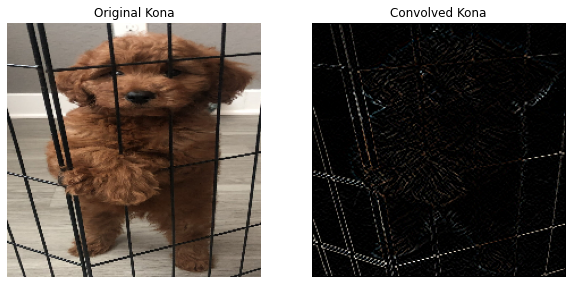

In [329]:
e1_img = cv.filter2D(small_img, -1, e1_kernel)
compare_imgs(small_img, e1_img, (10, 6))

In [326]:
e2_kernel = [[0, -1,-0],
            [-1, 4, -1],
            [0, -1, 0]]
e2_kernel = np.array(e2_kernel, np.float32)

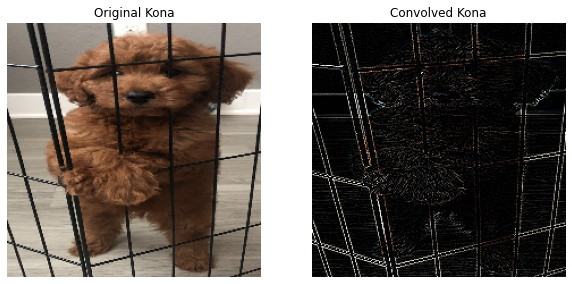

In [328]:
e2_img = cv.filter2D(small_img, -1, e2_kernel)
compare_imgs(small_img, e2_img, (10, 6))

Since Kona is a lil puppy, she doesn't have sharp edges that our kernel can operate over. But the cage itself does and those show up

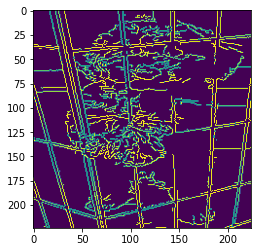

In [344]:
plt.imshow(cv.Canny(small_img, 100,200))

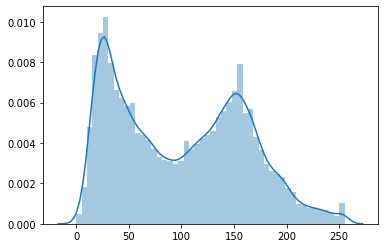

In [345]:
sns.distplot(small_img.flatten());

We did alot of erosion & dilation in the segmentation task as well -- let's take a look at those now: https://docs.opencv.org/master/d9/d61/tutorial_py_morphological_ops.html

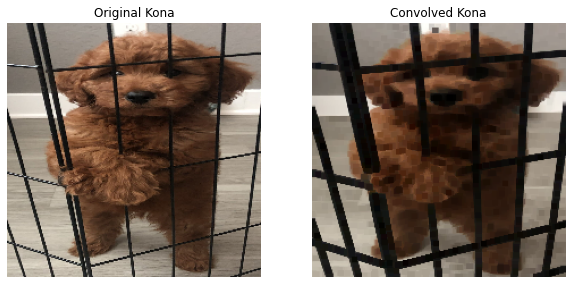

In [353]:
#erodes away boundaries of foreground objects 
img_erosion = cv.erode(small_img, np.ones((5,5), np.uint8), iterations=1)
compare_imgs(small_img, img_erosion, (10,8))

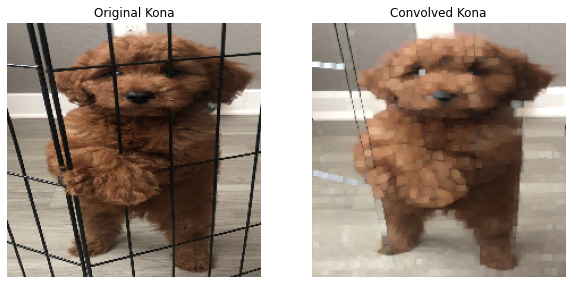

In [356]:
#increases size of foreground object
img_dilate = cv.dilate(small_img, np.ones((5,5), np.uint8), iterations=1)
compare_imgs(small_img, img_dilate, (10,8))

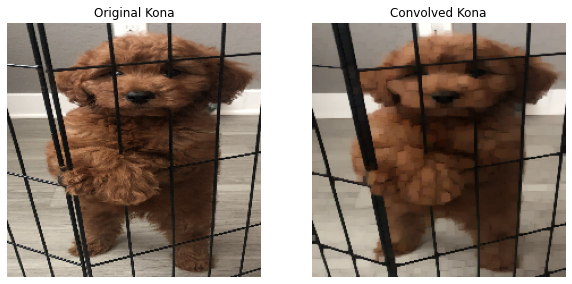

In [359]:
#opening= erosion-->dilation. Useful for removing noise
img_open = cv.morphologyEx(small_img, cv.MORPH_OPEN, np.ones((5,5), np.uint8))
compare_imgs(small_img, img_open, (10,8))

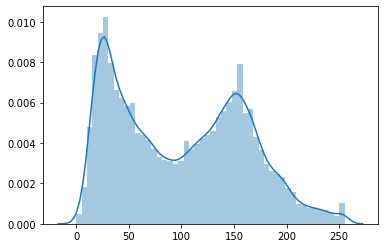

In [398]:
sns.distplot(small_img.flatten());

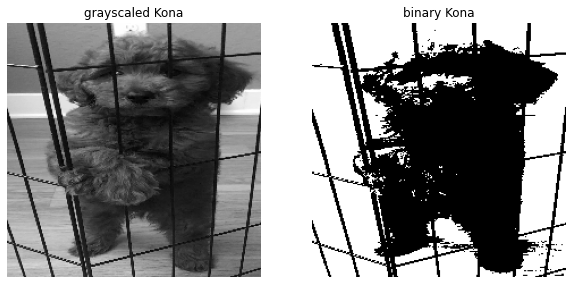

In [431]:
#the cv2 docs claim it should be a binary image(!)....
#convert to grayscale first to remove the channels
fig, ax = subplots(1, 2, figsize=(10,8))
ax[0].axis('off'), ax[1].axis('off')
ax[0].set_title('grayscaled Kona')
ax[1].set_title('binary Kona')
ax[0].imshow((cv.cvtColor(small_img, cv.COLOR_BGR2GRAY)), cmap='gray')
ax[1].imshow((cv.cvtColor(small_img, cv.COLOR_BGR2GRAY)>100), cmap='gray');

In [435]:
#annoying to keep calling all of those for grayscale
def gray_imgs(img, conv_img, dimensions, cmap=None):
    fig, ax = subplots(1, 2, figsize=dimensions)
    ax[0].axis('off')
    ax[1].axis('off')
    ax[0].imshow(img, cmap='gray')
    ax[1].imshow(conv_img, cmap='gray')

In [396]:
binary_kona = cv.cvtColor(small_img, cv.COLOR_BGR2GRAY) > 100

We did that conversion to grayscale and then to binary in a more manual way above -- openCV has their own threshold function that accomplishes the same task -- the line below confirms just that

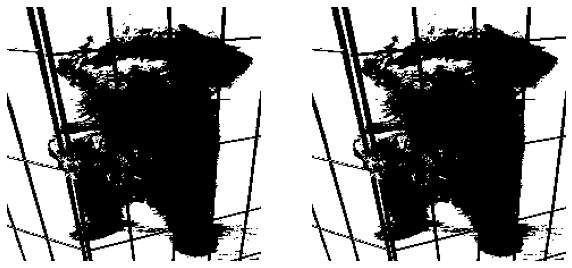

In [439]:
gray_kona = cv.cvtColor(small_img, cv.COLOR_BGR2GRAY)
binary_kona_2 = cv.threshold(gray_kona, 100, 255,
                            cv.THRESH_BINARY)[1]
gray_imgs(binary_kona, binary_kona_2, (10,8))

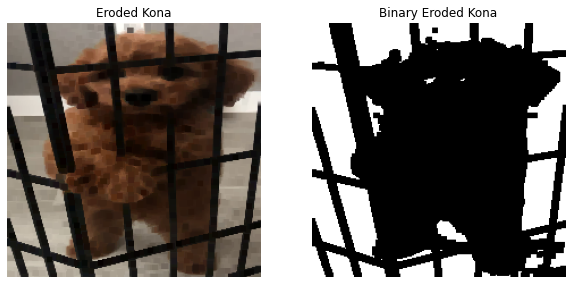

In [440]:
#now lets try the erosion again with our binary image
#erode fxn doesn't like boolean matrix -- hence the switch to float32
binary_erosion = cv.erode(np.array(binary_kona, np.float32),
                          np.ones((5,5), np.uint8), iterations=1)
fig, ax = subplots(1, 2, figsize=(10, 8))
ax[0].axis('off')
ax[1].axis('off')
ax[0].imshow(img_erosion, cmap='gray')
ax[1].imshow(binary_erosion, cmap='gray')
ax[0].set_title('Eroded Kona')
ax[1].set_title('Binary Eroded Kona');

Ok - that makes more sense now in regards to the type of segmentation we'll be implementing the lung scans

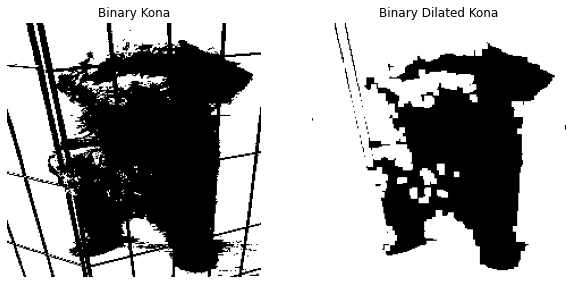

In [414]:
binary_dilate = cv.dilate(np.array(binary_kona, np.float32), 
                          np.ones((5,5), np.uint8), iterations=1)
fig, ax = subplots(1, 2, figsize=(10, 8))
ax[0].axis('off')
ax[1].axis('off')
ax[0].imshow(binary_kona, cmap='gray')
ax[1].imshow(binary_dilate, cmap='gray')
ax[0].set_title('Binary Kona')
ax[1].set_title('Binary Dilated Kona');

https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html --> could go through all of this and then create a kaggle kernel outlining the steps one by one(!)